# <center> Who’s the Songster !</center>

**Speaker recognition** is the identification of a person from characteristics of his/her voice is an important human trait most take for granted in natural human-to-human interaction/communication. It is also called voice recognition. There is a difference between speaker recognition (recognizing who is speaking) and speech recognition (recognizing what is being said). These two terms are frequently confused, and **voice recognition** can be used for both.

#### Overview :
> To create such a system, naturally the tool of choice would be an image classifier. Basically, this is the high level view of what i am going to do in building this recognition task.

## Importing All Libraries

In [1]:
#------------------------------------------------Data Processing-------------------------------------------------------------#
import numpy as np
import pandas as pd
import seaborn as sb
sb.set(style='ticks')    
#-----------------------------------------------Deep Learning Karas----------------------------------------------------------#
from keras.preprocessing.image import ImageDataGenerator
from keras import applications
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings("ignore")
import time
import matplotlib.pyplot as plt
import numpy as np
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dropout
from keras.layers import Flatten
from keras.constraints import maxnorm
from keras.optimizers import SGD
from keras.layers import Activation
from keras.layers.convolutional import Conv2D
from keras.layers.convolutional import MaxPooling2D
from keras.layers.normalization import BatchNormalization
from keras.utils import np_utils
from keras import initializers

from IPython.display import Audio
import librosa

#from keras_sequential_ascii import sequential_model_to_ascii_printout
from keras import backend as K
import IPython.display
from glob import glob #recursive file finding for loading

import numpy as np
import matplotlib.pyplot as plt
import copy
from scipy.io import wavfile

import scipy.ndimage
from datetime import datetime
import os



#------------------------------------------Import Tensorflow with multiprocessing---------------------------------------------#
import tensorflow as tf
import multiprocessing as mp

#------------------------------------------Sklearn----------------------------------------------------------------------------#
from sklearn.model_selection import train_test_split

Using TensorFlow backend.


## About Data

In [4]:
%%cmd
cd da
cd train
dir
cd taylor
dir

Microsoft Windows [Version 10.0.17763.864]
(c) 2018 Microsoft Corporation. All rights reserved.

(base) C:\Users\DELL\Documents\Project\Songster>cd da

(base) C:\Users\DELL\Documents\Project\Songster\da>cd train

(base) C:\Users\DELL\Documents\Project\Songster\da\train>dir
 Volume in drive C has no label.
 Volume Serial Number is FA1C-7F2F

 Directory of C:\Users\DELL\Documents\Project\Songster\da\train

05/13/2019  10:07 PM    <DIR>          .
05/13/2019  10:07 PM    <DIR>          ..
05/13/2019  10:07 PM    <DIR>          edsheeran
05/13/2019  10:07 PM    <DIR>          eminem
05/13/2019  10:07 PM    <DIR>          selena
05/13/2019  10:07 PM    <DIR>          taylor
               0 File(s)              0 bytes
               6 Dir(s)  189,860,675,584 bytes free

(base) C:\Users\DELL\Documents\Project\Songster\da\train>cd taylor

(base) C:\Users\DELL\Documents\Project\Songster\da\train\taylor>dir
 Volume in drive C has no label.
 Volume Serial Number is FA1C-7F2F

 Directory of C:\U

## Using Librosa Library For Proper Visulation Of Audio File

In [5]:
y,sr=librosa.load('q.wav')

In [6]:
print(type(y),type(sr))

<class 'numpy.ndarray'> <class 'int'>


In [7]:
print(y.shape,sr)

(5622912,) 22050


In [8]:
Audio(data=y,rate=sr)

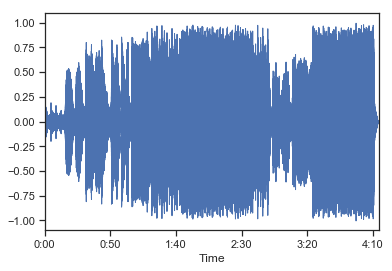

In [9]:
import librosa.display
librosa.display.waveplot(y, sr=sr)

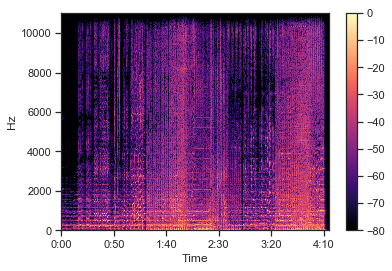

In [10]:
# Display a spectrogram/chromagram/cqt/etc.
D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
librosa.display.specshow(D,x_axis='time',y_axis='linear')
plt.colorbar()

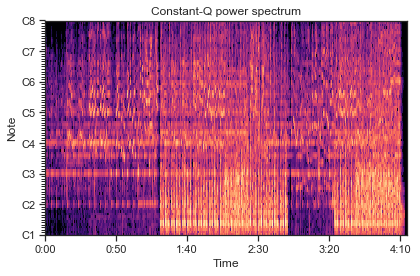

In [11]:
# Compute the constant-Q transform of an audio signal.
C = np.abs(librosa.cqt(y, sr=sr))
librosa.display.specshow(librosa.amplitude_to_db(C, ref=np.max),
                         sr=sr, x_axis='time', y_axis='cqt_note')
plt.title('Constant-Q power spectrum')
plt.tight_layout()

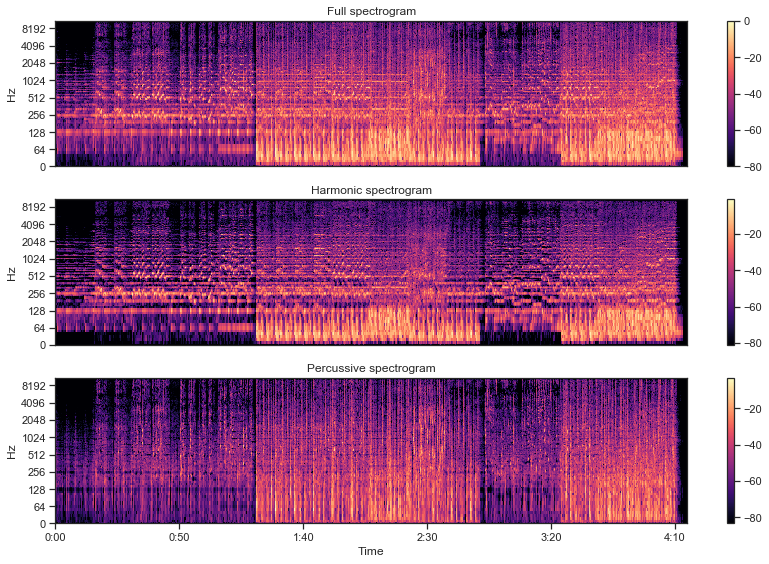

In [14]:
''''''
# y_harm, y_perc = librosa.effects.hpss(y)
# plt.subplot(3, 1, 3)
# librosa.display.waveplot(y_harm, sr=sr, alpha=0.25)
# librosa.display.waveplot(y_perc, sr=sr, color='r', alpha=0.5)
# plt.title('Harmonic + Percussive')
# plt.tight_layout()
import librosa
import librosa.display
D = librosa.stft(y)
D_harmonic, D_percussive = librosa.decompose.hpss(D)
rp = np.max(np.abs(D))

plt.figure(figsize=(12, 8))

plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(D, ref=rp), y_axis='log')
plt.colorbar()
plt.title('Full spectrogram')

plt.subplot(3, 1, 2)
librosa.display.specshow(librosa.amplitude_to_db(D_harmonic, ref=rp), y_axis='log')
plt.colorbar()
plt.title('Harmonic spectrogram')

plt.subplot(3, 1, 3)
librosa.display.specshow(librosa.amplitude_to_db(D_percussive, ref=rp), y_axis='log', x_axis='time')
plt.colorbar()
plt.title('Percussive spectrogram')
plt.tight_layout()

In [15]:
from keras.preprocessing.image import ImageDataGenerator
from keras.layers.normalization import BatchNormalization
import itertools

In [16]:
train_path='da/train'
test_path='da/test'
valid_path='da/valid'

In [17]:
train_batches = ImageDataGenerator().flow_from_directory(train_path,target_size=(224,224),classes=['edsheeran','eminem','taylor','selena'],batch_size=10)
valid_batches = ImageDataGenerator().flow_from_directory(valid_path,target_size=(224,224),classes=['edsheeran','eminem','taylor','selena'],batch_size=4)
test_batches = ImageDataGenerator().flow_from_directory(test_path,target_size=(224,224),classes=['edsheeran','eminem','taylor','selena'],batch_size=10)

Found 100 images belonging to 4 classes.
Found 38 images belonging to 4 classes.
Found 46 images belonging to 4 classes.


## VGG16

**VGGNet** consists of **16 convolutional layers** and is very appealing because of its very uniform architecture. Similar to AlexNet, only 3x3 convolutions, but lots of filters. Trained on 4 GPUs for 2–3 weeks. It is currently the most preferred choice in the community for extracting features from images. The weight configuration of the VGGNet is publicly available and has been used in many other applications and challenges as a baseline feature extractor.

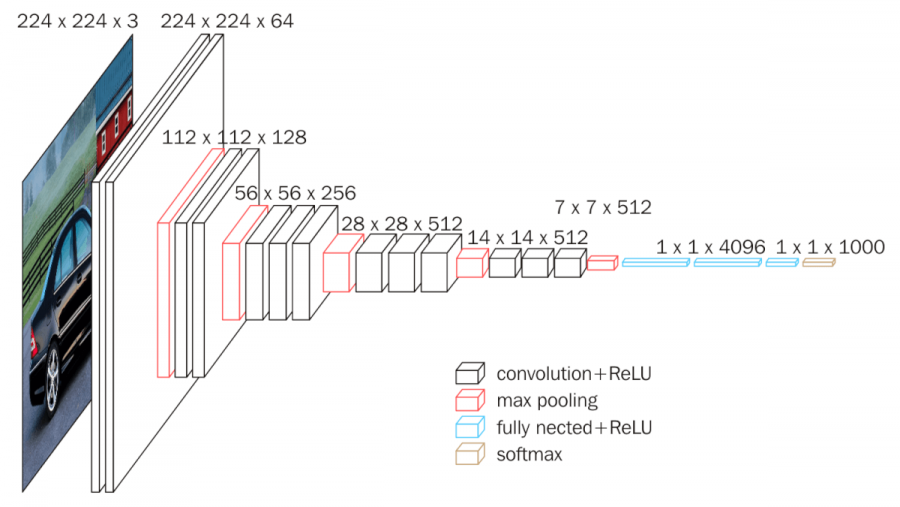

In [18]:
from IPython.core.display import Image, display
display(Image(filename='one.png'))

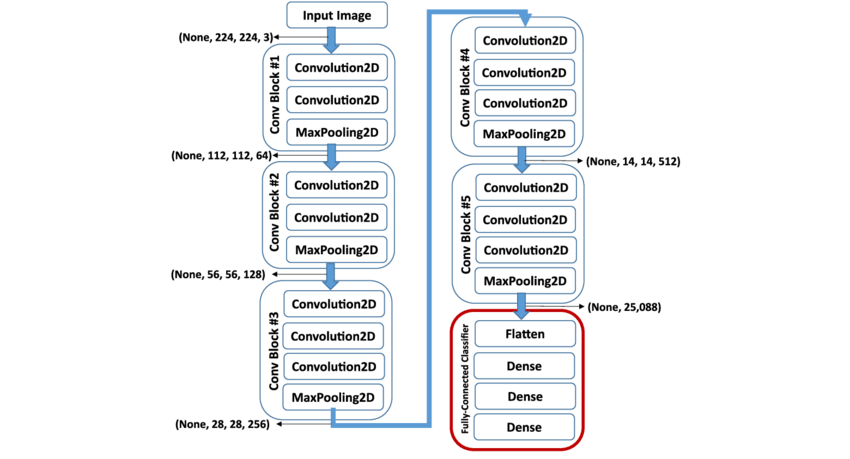

In [19]:
display(Image(filename='three.png'))

In [20]:
from keras.applications.vgg16 import VGG16
vgg16_model = VGG16()

553467904/553467096 [==============================] - 1238s 2us/step


In [22]:
vgg16_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [23]:
type(vgg16_model)

keras.engine.training.Model

In [24]:
model = Sequential()
for layer in vgg16_model.layers:
    model.add(layer)

In [25]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
_________________________________________________________________
block3_conv1 (Conv2D)        (None, 56, 56, 256)      

In [26]:
model.layers.pop()

In [28]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
_________________________________________________________________
block3_conv1 (Conv2D)        (None, 56, 56, 256)      

In [29]:
for layer in model.layers:
    layer.trainable = False

In [30]:
model.add(Dense(4,activation='relu'))

In [31]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
_________________________________________________________________
block3_conv1 (Conv2D)        (None, 56, 56, 256)      

In [32]:
from keras import optimizers
optimizer = optimizers.Adam(lr=.0011)
model.compile(optimizer=optimizer,loss='categorical_crossentropy',metrics=['accuracy'])

In [35]:
model.fit_generator(train_batches,steps_per_epoch=20,validation_data=valid_batches,validation_steps=4,epochs=20,verbose=2)

Epoch 1/20
 - 36s - loss: nan - accuracy: 0.2500 - val_loss: nan - val_accuracy: 0.2500
Epoch 2/20
 - 38s - loss: nan - accuracy: 0.2500 - val_loss: nan - val_accuracy: 0.1875
Epoch 3/20
 - 37s - loss: nan - accuracy: 0.2500 - val_loss: nan - val_accuracy: 0.1429
Epoch 4/20
 - 37s - loss: nan - accuracy: 0.2500 - val_loss: nan - val_accuracy: 0.3750
Epoch 5/20
 - 37s - loss: nan - accuracy: 0.2500 - val_loss: nan - val_accuracy: 0.0714
Epoch 6/20
 - 37s - loss: nan - accuracy: 0.2500 - val_loss: nan - val_accuracy: 0.2500
Epoch 7/20
 - 37s - loss: nan - accuracy: 0.2500 - val_loss: nan - val_accuracy: 0.1875
Epoch 8/20
 - 37s - loss: nan - accuracy: 0.2500 - val_loss: nan - val_accuracy: 0.1429
Epoch 9/20
 - 37s - loss: nan - accuracy: 0.2500 - val_loss: nan - val_accuracy: 0.2500
Epoch 10/20
 - 37s - loss: nan - accuracy: 0.2500 - val_loss: nan - val_accuracy: 0.2143
Epoch 11/20
 - 37s - loss: nan - accuracy: 0.2500 - val_loss: nan - val_accuracy: 0.3125
Epoch 12/20
 - 37s - loss: nan